In [58]:
import pandas as pd
import numpy as np
import warnings
import missingno as msno
import plotly.express as px
import matplotlib.pyplot as plt
warnings.simplefilter("ignore")
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

url_1 = 'TrainingWiDS2021.csv'
url_2 = 'UnlabeledWiDS2021.csv'

In [59]:
# Splitted data to make same shape of both test and train so that we can apply pre processing on both
# Ref : https://www.kaggle.com/siavrez/2020fatures
medical_data = pd.read_csv(url_1, error_bad_lines=False, index_col=0)
train = medical_data.copy()
test_df = pd.read_csv(url_2, error_bad_lines=False, index_col=0)
y = medical_data["diabetes_mellitus"]
del medical_data['diabetes_mellitus']

Exploratory Data Analysis (EDA)

In [60]:
train.shape

(130157, 180)

In [61]:
# what data types how many cols
medical_data.dtypes.value_counts()

float64    157
int64       16
object       6
dtype: int64

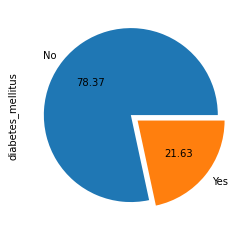

In [62]:
#Plot diabetes_mellitus counts to verify the distribution of data
target = 'diabetes_mellitus'
train[target].value_counts().plot(kind="pie", explode=[0,0.1], autopct="%.2f", labels=["No","Yes"])
plt.show()

#Data is imbalanced , have to balance the data

In [87]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(train.head(2))
    display(train.describe())
    display(test_df.head(2))
    display(test_df.describe())

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
1,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,NaN,0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,68.0,63.0,119.0,108.0,NaN,NaN,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,NaN,NaN,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,1
2,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,NaN,1,12.7,NaN,NaN,95.0,31.0,95.0,31.0,118.0,72.0,NaN,NaN,120.0,38.0,120.0

,encounter_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
count,130157.000000,130157.000000,125169.000000,125667.000000,130157.000000,128080.000000,130157.000000,130157.000000,130157.0,126694.000000,51994.000000,128472.000000,129292.000000,130157.000000,130157.000000,47597.000000,104746.000000,105275.000000,30437.000000,127967.000000,127967.000000,129448.000000,127967.000000,115461.000000,129848.000000,103399.000000,130157.000000,129737.000000,30437.000000,30437.000000,30437.000000,30437.000000,129349.000000,105638.00000,123546.000000,66990.000000,130157.000000,100682.000000,35089.000000,35089.000000,129880.000000,129880.000000,128521.000000,128521.000000,129895.000000,129895.000000,35289.000000,35289.000000,129830.000000,129830.000000,127929.000000,127929.000000,129474.000000,129474.000000,129625.000000,129625.000000,35119.000000,35119.000000,129886.000000,129886.000000,128534.000000,128534.000000,125663.000000,125663.000000,25328.000000,25328.000000,124630.000000,124630.000000,118818.000000,118818.000000,126083.000000,126083.000000,25391.000000,25391.000000,123627.000000,123627.000000,116860.000000,116860.000000,123703.000000,123703.000000,123915.000000,123915.000000,25350.000000,25350.00000,124638.000000,124638.000000,11

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
1,144740,10141,72,NaN,0,Caucasian,F,152.4,Floor,Accident & Emergency,82,admit,Med-Surg ICU,0.015278,0,NaN,2.8,110.0,104.01,0,0,1.9,44.0,1.49,NaN,4.0,6.0,0.0,5.0,97.0,38.0,39.9,0,54.0,NaN,NaN,NaN,NaN,31.0,130.0,36.4,NaN,0,5.4,NaN,NaN,104.0,40.0,104.0,40.0,66.0,38.0,NaN,NaN,123.0,54.0,123.0,54.0,35.0,15.0,100.0,96.0,NaN,NaN,149.0,76.0,149.0,76.0,38.7,35.6,NaN,NaN,59.0,59.0,59.0,59.0,46.0,44.0,NaN,NaN,80.0,80.0,80.0,80.0,19.0,19.0,97.0,96.0,NaN,NaN,116.0,116.0,116.0,116.0,36.4,36.4,2.8,2.8,1.9,1.9,44.0,40.0,9.8,9.3,1.49,1.44,104.0,97.0,26.0,23.0,14.5,14.2,42.8,39.9,NaN,NaN,NaN,NaN,173.0,173.0,5.7,4.9,132.0,130.0,5.6,5.4,2.8,2.8,1.9,1.9,40.0,40.0,9.8,9.8,1.49,1.49,104.0,104.0,26.0,26.0,14.5,14.5,42.8,42.8,NaN,NaN,NaN,NaN,173.0,173.0,4.9,4.9,132.0,132.0,5.6,5.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0
2,141990,10141,86,NaN,0,Caucasian,F,175.3,Emergency Department,Accident & Emergency,82,admit,Med-Surg ICU,0.000000,0,NaN,NaN,117.0,106.01,0,0,NaN,19.0,0.92,NaN,4.0,6.0,0.0,5.0,73.0,116.0,NaN,0,41.0,NaN,NaN,NaN,NaN,53.0,142.0,36.3,NaN,0,NaN,NaN,NaN,101.0,27.0,101.0,27.0,116.0,56.

,encounter_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,10234.000000,10234.000000,10234.000000,9219.000000,10234.000000,9933.000000,10234.000000,10234.000000,10234.0,9326.000000,4179.000000,10064.000000,10126.000000,10234.000000,10234.000000,3924.000000,8173.000000,8191.000000,2599.000000,10029.000000,10029.000000,10173.000000,10029.000000,9024.000000,10204.000000,8120.000000,10234.000000,10182.000000,2599.000000,2599.000000,2599.000000,2599.000000,10170.000000,8241.000000,9563.000000,5044.000000,10234.000000,7858.000000,2909.000000,2909.000000,10211.000000,10211.000000,10085.000000,10085.000000,10210.000000,10210.000000,2919.000000,2919.000000,10197.000000,10197.000000,10022.000000,10022.000000,10179.000000,10179.000000,10172.000000,10172.000000,2912.000000,2912.000000,10211.000000,10211.000000,10086.000000,10086.000000,9804.000000,9804.000000,2061.000000,2061.000000,9582.000000,9582.000000,9078.000000,9078.000000,9683.000000,9683.000000,2048.000000,2048.000000,9437.000000,9437.000000,8845.000000,8845.000000,9510.000000,9510.000000,9508.000000,9508.000000,2064.000000,2064.000000,9583.000000,9583.000000,9079.000000,9079.000000,7580.000000,7580.000000,4694.000000,4694.000000,4374.000000,4374.000000,9126.000000,9126.000000,8832.000000,

In [88]:
# Percentage of missing values 

pd.DataFrame(train.isna().sum()*100/len(train))

,0
encounter_id,0.000000
hospital_id,0.000000
age,3.832295
bmi,3.449680
elective_surgery,0.000000
...,...
immunosuppression,0.000000
leukemia,0.000000
lymphoma,0.000000
solid_tumor_with_metastasis,0.000000


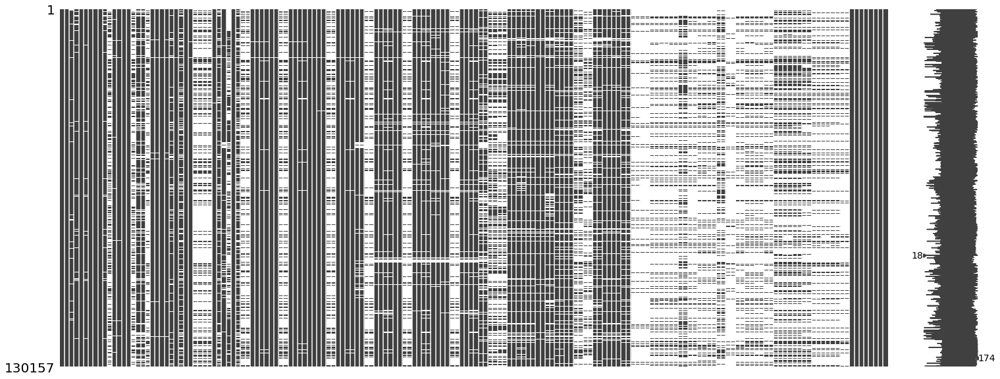

In [89]:
#plot the missing value graph
msno.matrix(train.select_dtypes(include=[np.number]))
plt.show()

In [90]:
# gender with respect to target variable
fig = px.histogram(medical_data, x='gender', y=y, title="Gender wrt diabetes_mellitus", width=600, height=450)
fig.show()

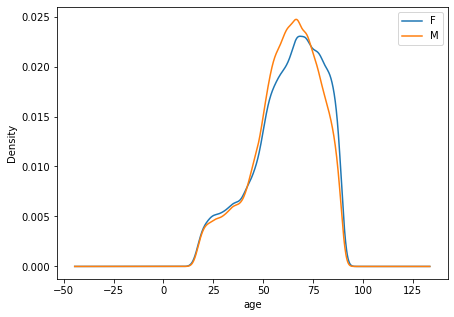

In [91]:
#let's see te age distribution of Male and Female
#pd.crosstab(train['age'],train['gender'])

plt.rcParams['figure.figsize'] = (7,5)
train.groupby('gender')['age'].plot(kind="kde")
plt.xlabel("age")
plt.legend(loc="best")
plt.show()

In [92]:
train['ethnicity'].value_counts()

Caucasian           100236
African American     13911
Other/Unknown         6261
Hispanic              5049
Asian                 2198
Native American        915
Name: ethnicity, dtype: int64

In [93]:
fig = px.histogram(train, x='icu_stay_type', y=target, width=600, height=450, title="icu_stay_type wrt target")
fig.show()

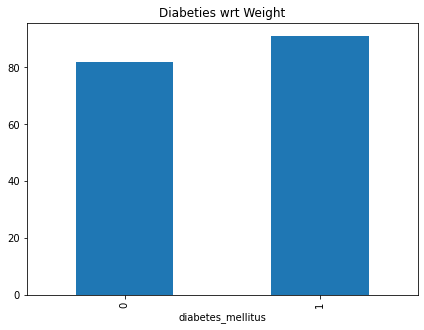

In [94]:
#Did Diabetic Person Weight more?
train.groupby(target)['weight'].mean().plot(kind="bar")
plt.title("Diabeties wrt Weight")
plt.show()

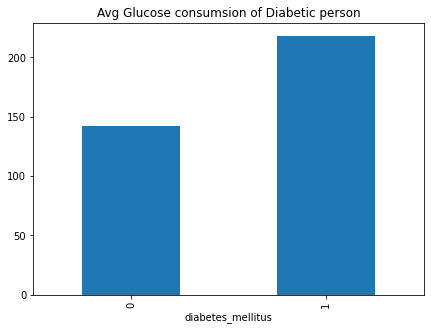

In [95]:
# diabetic patient assumes to consume more glucose
train.groupby(target)['glucose_apache'].mean().plot(kind="bar",title="Avg Glucose consumsion of Diabetic person")
plt.show()

#Diabetic Person weight much more then Non-Diabetic.
#This could happen because their body consumes lot of glucose from food as we have seen which results in weight gain

# Pre processing by Aishwarya

In [63]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

def preProcessing1(df: pd.DataFrame, y:pd.Series) -> pd.DataFrame:
  columns=df.columns

  #dropping column which are either irrelevant or around 50% of missing values
  df=df.drop(['encounter_id', 'hospital_id', 'icu_id', 'albumin_apache','bilirubin_apache','fio2_apache','paco2_apache','paco2_for_ph_apache','pao2_apache','ph_apache', 'urineoutput_apache'], axis=1)

  #separating categorical & numerical features
  df_cat = df.select_dtypes("object")
  df_num = df.select_dtypes("number")
  cat_cal = df_cat.columns
  num_cal = df_num.columns
  
  #imputing categorical features by mode
  impute_size1=SimpleImputer(strategy="most_frequent") 
  df_cat = impute_size1.fit_transform(df_cat)
  df_cat = pd.DataFrame(df_cat, columns = cat_cal)

  #imputing numerical features by mean
  impute_size2=SimpleImputer(missing_values=np.nan, strategy="mean") 
  df_num = impute_size2.fit_transform(df_num)
  df_num = pd.DataFrame(df_num, columns = num_cal)

  #concatenating both categorical & numerical features
  df = df_cat.join(df_num)
  return df, [impute_size1, impute_size2 ]
  
  #Standardization
  scaler = StandardScaler()
  scaled_df = scaler.fit_transform(df_num)
  df_num_scale = pd.DataFrame(data=scaled_df, columns=columns)

  #One Hot Encoding
  columnTransformer = ColumnTransformer([('encoder',
                                        OneHotEncoder(),
                                        [0])],
                                     remainder='passthrough')
  onehotencoder = OneHotEncoder()
  df_cat_encod = np.array(columnTransformer.fit_transform(df_cat), dtype = np.str)
  
  return df, [impute_size1, impute_size2, scaler, df_cat_encod ]



# Pre processing by Anjali

In [64]:
#!pip install tqdm
from sklearn.linear_model import LinearRegression, LassoCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from scipy import stats, special
import pandas as pd
import numpy as np
import os
import warnings
warnings.simplefilter("ignore")

# Ref: https://www.kaggle.com/shashankasubrahmanya/missing-data-imputation-using-regression

# filling missing values based on linear regression and the most correlated variables
# linear regression -> F-test (which columns are mostly related with the given target column, other than "diabetes")
# Multi-colinearity
# target = diabetes
# Remove features which has more than 50% percentage of missing values
# Return reduced dataset

# Linear Regression
def fillna_using_linear_model(df: pd.DataFrame):
    fea_cols=[]
    for col in df.columns:
        if df[col].dtype=='float64':
            fea_cols.append(col)

    correl = df[fea_cols].corr()

    for col in tqdm(fea_cols):
        nan_ratio = df[col].isnull().sum() / df.shape[0]
        if nan_ratio > 0:
            best_nan_ratio = nan_ratio
            best_col = None
            for id in correl.loc[(correl[col] > 0.7) | (correl[col] < -0.7), col].index:
                nan_temp_ratio = df[id].isnull().sum() / df.shape[0]
                if best_nan_ratio > nan_temp_ratio:
                    best_nan_ratio = nan_temp_ratio
                    best_col = id
            if best_col != None:
                sub = df[[col, best_col]].copy()
                sub = sub.dropna()
                reg = LinearRegression(fit_intercept=True).fit(np.expand_dims(sub[best_col], axis=1), sub[col])
                print(reg.score(np.expand_dims(sub[best_col], axis=1), sub[col]))
                if reg.score(np.expand_dims(sub[best_col], axis=1), sub[col])>0.7:
                    if df.loc[(~df[best_col].isnull()) & (df[col].isnull()), col].shape[0] > 0:
                        df.loc[(~df[best_col].isnull()) & (df[col].isnull()), col] = \
                        reg.predict(np.expand_dims(df.loc[(~df[best_col].isnull()) & (df[col].isnull()), best_col], axis=1))

    return df


def preProcessing2(df: pd.DataFrame, y:pd.Series) -> pd.DataFrame:
  columns=df.columns

# Replace values such as +,- ininity with nan
  df = df.replace([np.inf, -np.inf], np.nan)

# Linear regression
  linReg = fillna_using_linear_model(df)

# Simple Imputing
  imputer = SimpleImputer(strategy="mean")
  imputed_df = pd.DataFrame(imputer.fit_transform(linReg.values))

# Standardization
  scaler = StandardScaler()
  scaled_df = scaler.fit_transform(imputed_df)
  df= pd.DataFrame(data=scaled_df, columns=columns)
  
  return df, [imputer, scaler]

# dd = preProcessing2(medical_data.copy(), y)
# dd


# Pre processing by Jae Woong

In [65]:
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer # MICE 
from sklearn.preprocessing import StandardScaler
# from discretization import MDLP
# from mdlp.discretization import MDLP

def preProcessing3(df: pd.DataFrame, y: pd.Series) -> pd.DataFrame:
  columns = df.columns

  # Log transform for skewing data
  # https://stats.stackexchange.com/questions/267078/why-is-skewed-data-not-preferred-for-modelling
  # https://stats.stackexchange.com/questions/299154/the-benefit-of-unskewing-skewed-data
  logs_transform_list = ['d1_bilirubin_min', 'd1_bilirubin_max', 'd1_glucose_max', 'h1_bilirubin_max', 'h1_bilirubin_min', 'h1_bun_max', 'h1_bun_min']
  df[logs_transform_list] = np.log2(df[logs_transform_list])

  # Simple Imputing
  imputer = SimpleImputer(strategy="mean")
  imputed_df = imputer.fit_transform(df.values)

  # Standardization
  scaler = StandardScaler()
  imputed_scaled_df = scaler.fit_transform(imputed_df)

  df = pd.DataFrame(columns=columns, data=imputed_scaled_df)

  return df, [{"columns": logs_transform_list, "transform": np.log2}, imputer, scaler]

# Pre processing by Uma

In [66]:
#ref: https://www.kaggle.com/lhagiimn/7th-place-solution-wids-2021
#ref:https://www.kaggle.com/letianyu/wids-2021-notebook

def remove_NaN_Values(df, threshold):
    # store the name of columns
    # drop the same for the test set (later)
    NaN_cols = []
    for col in df.columns:
        NaN_ratio = df[col].isnull().sum() / df.shape[0]
        if NaN_ratio >= threshold:
            NaN_cols.append(col)
    df = df.drop(NaN_cols, axis=1)
    return df,NaN_cols

def preProcessing4(df: pd.DataFrame, y: pd.Series) -> pd.DataFrame:
    columns = df.columns

    Removed_NaN_df,NaN_cols = remove_NaN_Values(df,0.5)

    return Removed_NaN_df, NaN_cols


# Combine all pre processings 

In [67]:
df1 = medical_data.iloc[:, :45]
prep_df1, tf1 = preProcessing1(df1, y)
prep_df1.index = medical_data.index

df2 = medical_data.iloc[:, 45:90]
prep_df2, tf2 = preProcessing2(df2, y)
prep_df2.index = medical_data.index

df3 = medical_data.iloc[:, 90:135]
prep_df3, tf3 = preProcessing3(df3, y)
prep_df3.index = medical_data.index

df4 = medical_data.iloc[:, 135:]
prep_df4, tf4 = preProcessing4(df4, y)
prep_df4.index = prep_df1.index

prep_df = pd.concat([prep_df1, prep_df2, prep_df3, prep_df4], axis=1)

print(f'Percent of Nans: {round(prep_df.copy().isna().sum().sum()/len(prep_df.copy()), 2)}')

 11%|█████████▏                                                                         | 5/45 [00:00<00:01, 35.17it/s]

0.563520769020351
0.9933743343176455
0.9932092949406127
0.5556868832041206


 31%|█████████████████████████▌                                                        | 14/45 [00:00<00:00, 32.22it/s]

0.6232299891476356
0.5630410484129751
0.6303842387953887
0.5152979908671134


 64%|████████████████████████████████████████████████████▊                             | 29/45 [00:00<00:00, 44.87it/s]

0.9928207761805053
0.9913514557124004
0.5060654310356865
0.9694702204192752
0.9658512634599362


 76%|█████████████████████████████████████████████████████████████▉                    | 34/45 [00:00<00:00, 38.97it/s]

0.6155171814780586
0.49954907647888736
0.716253639395113
0.7618525388005946
0.972967652946108


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [00:01<00:00, 42.30it/s]

0.9928344337233268
0.6277670731828182


Percent of Nans: 0.0


In [68]:
prep_df


,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,age,bmi,elective_surgery,height,...,h1_calcium_max,h1_calcium_min,h1_creatinine_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
1,Caucasian,M,Floor,Floor,admit,CTICU,68.0,22.732803,0.0,180.3,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0
2,Caucasian,F,Floor,Floor,admit,Med-Surg ICU,77.0,27.421875,0.0,160.0,...,8.457641e-01,8.572557e-01,-1.391968e+00,0,0,0,0,0,0,0
3,Caucasian,F,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,25.0,31.952749,0.0,172.7,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0
4,Caucasian,F,Operating Room,Operating Room / Recovery,admit,CTICU,81.0,22.635548,1.0,165.1,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0
5,Caucasian,M,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,19.0,29.110260,0.0,188.0,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130153,Caucasian,M,Emergency Department,Accident & Emergency,admit,Cardiac ICU,50.0,29.287256,0.0,175.3,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0
130154,Caucasian,F,Direct Admit,Accident & Emergency,admit,MICU,79.0,29.653433,0.0,162.6,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0
130155,African American,M,Emergency Department,Accident & Emergency,admit,Cardiac ICU,73.0,32.265371,0.0,177.8,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0
130156,Caucasian,M,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,81.0,24.408579,0.0,185.4,...,4.610996e-15,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0


Uma : Creating Average Features:


In [69]:
categorical_features = [feature for feature in prep_df.columns if prep_df[feature].dtype == 'O']
numerical_features = [feature for feature in prep_df.columns if prep_df[feature].dtype != 'O']
binary_features = [feature for feature in numerical_features if prep_df[feature].nunique() == 2]
cont_features = [feature for feature in numerical_features if feature not in binary_features]

print("categorical features:" , len(categorical_features))
print("Numerical features:" , len(numerical_features))
print("Binary features:" , len(binary_features))
print("Continuous features:" , len(cont_features))

categorical features: 6
Numerical features: 125
Binary features: 12
Continuous features: 113


In [12]:

# # Instead of having too many features as min and max, 
# # what we will do is combine them based on avg (min+max)/2, 
# # which will help in easy analysis and features will also reduce.
# # Working on Continuous features. Creating a copy of main DS to work on it seperately.

# avg_feature_df = prep_df.copy()
# max_min_df = avg_feature_df[cont_features].copy()

# max_min_features = [feature for feature in cont_features if '_max' in feature or '_min' in feature and feature not in "albumin_apache"]
# print("total number of features: ",len(max_min_features))

# #separate out the max and min features
# max_features = [feature for feature in max_min_features if "_max" in feature]
# min_features = [feature for feature in max_min_features if "_min" in feature]
# print("Number of max features: ",len(max_features))
# print("Number of min features: ",len(min_features))

# #There is some mismatch between max and min features count. Because of 2 reasons:
# #1. One feature i.e h1_creatinine_min has more than 50% (81%)of missing values so it's been removed from dataset

# #so, to make feature count same let's remove the h1_creatinine_max from max_features.
# print("After adjustment")
# max_features.remove('h1_creatinine_max')
# max_min_features.remove('h1_creatinine_max')
# print("total number of features: ",len(max_min_features))
# print("Number of max features: ",len(max_features))
# print("Number of min features: ",len(min_features))

In [13]:
# # take the average and add them to the data.
# for i in range(0,len(max_features)):
#     col = "_".join(min_features[i].split("_")[:-1]) + "_avg"
#     avg = (max_min_df[min_features[i]] +  max_min_df[max_features[i]]) / 2
#     max_min_df[col] = avg

# # we got our average features, now remove the max and min features from data
# max_min_df.drop(max_features, axis=1, inplace=True)
# max_min_df.drop(min_features, axis=1, inplace=True)

# # we have reduce a 31 features, which is better then PCA too.
# max_min_df.shape

# avg_features = [feature for feature in max_min_df.columns if 'avg' in feature]
# print("Number of Average Features:" , len(avg_features))


# #let's see the percentage of missing values, if % will be less ten 30 then we will impute it.
# miss_nan = max_min_df[avg_features].isnull().sum() / len(max_min_df) * 100
# miss_nan.sort_values(ascending=False).to_frame().head(10)

# #drop the feature which are having missing greater then 30%
# great_30 = miss_nan[miss_nan[:] > 30].index
# max_min_df.drop(great_30, axis=1, inplace=True)

# less_30 = miss_nan[miss_nan[:] < 30].index
# # as we have taken the avg, so just fill it with mean now.
# for col in less_30:
#     max_min_df[col] = max_min_df[col].fillna(max_min_df[col].mean())

In [14]:
# #Working on Numerarical features other than the min max features
# other_nan_col = [feature for feature in max_min_df.columns if "avg" not in feature]
# print("total other features then AVG: ", len(other_nan_col))

# for col in other_nan_col:
#     max_min_df[col] = max_min_df[col].fillna(max_min_df[col].mean())

# #check if any null values remaining
# max_min_df.isnull().sum().sum()

# avg_feature_df.drop(cont_features,axis=1, inplace=True)

# avg_feature_df = pd.concat([avg_feature_df, max_min_df], axis=1)

# avg_feature_df.shape

# #We have reduced 45 features from the dataset. (131-45=86)

In [15]:
# avg_feature_df

In [70]:
#Working on Categorical features

prep_df['gender'] = prep_df['gender'].map({'M':0,'F':1})

# let's encode the feature using Integer label encoding
# we will use value_counts to know, how it is encoded, you can also use unique()
cat_cols = ['ethnicity', 'hospital_admit_source','icu_admit_source','icu_stay_type','icu_type']
for col in cat_cols:
    map_dict = {k: i for i, k in enumerate(prep_df[col].value_counts().index, 0)}
    prep_df[col] = prep_df[col].map(map_dict)

prep_df[categorical_features].head(2)

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type
1,0,0,2,2,0,7
2,0,1,2,2,0,0


creating clusters as features to improve classification models

In [17]:
# #Plot diabetes_mellitus counts to verify the distribution of data
# train_df = pd.concat([avg_feature_df, y], axis=1)

# #The dataset is skewed towards class 0, so,balace the dataset.
# df_majority = train_df[train_df['diabetes_mellitus']==0]
# df_minority = train_df[train_df['diabetes_mellitus']==1]

# # Upsampling
# df_minority_upsampled = resample(df_minority,
#                                  replace=True,       # sample with replacement
#                                  n_samples=83798,    # to match majority class
#                                  random_state= 303)  # reproducible results
 
# # Combine majority class with upsampled minority class
# df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 
# # Display new class counts
# df_upsampled.diabetes_mellitus.value_counts()

# target = 'diabetes_mellitus'
# df_upsampled[target].value_counts().plot(kind="pie", explode=[0,0.1], autopct="%.2f", labels=["No","Yes"])
# plt.show()

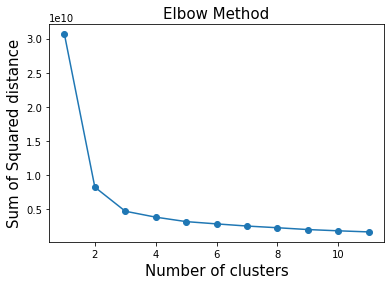

In [18]:
# #Clustering apart from being an unsupervised machine learning can also be used to 
# #create clusters as features to improve classification models.

# # plot elbow curve
# from sklearn.cluster import KMeans
# from sklearn.preprocessing import StandardScaler
# import scipy.cluster.hierarchy as hcluster
# from sklearn.cluster import AgglomerativeClustering
# import matplotlib.pyplot as plt

# #drop country column
# data=prep_df.drop(['ethnicity'],axis=1)

# #scaling data
# scaling=StandardScaler()
# scaled=scaling.fit_transform(data)

# scaled_df=pd.DataFrame(scaled,columns=data.columns)

# # princt scaled dataset
# scaled_df.head()

# a=[]
# K=range(1,12)
# for i in K:
#     kmean=KMeans(n_clusters=i)
#     kmean.fit(data)
#     a.append(kmean.inertia_)
    
# plt.plot(K,a,marker='o')
# plt.title('Elbow Method',fontsize=15)
# plt.xlabel('Number of clusters',fontsize=15)
# plt.ylabel('Sum of Squared distance',fontsize=15)
# plt.show()

In [19]:
# #chosing no. of clusters as 4 and refitting kmeans model
# kmeans = KMeans(n_clusters = 4,random_state = 111)
# kmeans.fit(scaled_df)

KMeans(n_clusters=4, random_state=111)

In [20]:
# #count number of records in every cluster
# pd.Series(kmeans.labels_).value_counts()

1    50414
3    42969
0    20506
2    16268
dtype: int64

In [21]:
# #calculate how good our model is
# #calculate Silhouette Coefficient for K=4
# from sklearn import metrics

# metrics.silhouette_score(scaled_df, kmeans.labels_)

0.040708807020523444

In [22]:
# #predicting values
# cluster_labels = kmeans.fit_predict(scaled_df)

# preds = kmeans.labels_
# kmeans_df = pd.DataFrame(prep_df)
# kmeans_df['KMeans_Cluster'] = preds
# kmeans_df.head(10)

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,age,bmi,elective_surgery,height,...,h1_calcium_min,h1_creatinine_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,KMeans_Cluster
1,0,0,2,2,0,7,68.0,22.732803,0.0,180.3,...,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0,1
2,0,1,2,2,0,0,77.0,27.421875,0.0,160.0,...,8.572557e-01,-1.391968e+00,0,0,0,0,0,0,0,1
3,0,1,0,0,0,0,25.0,31.952749,0.0,172.7,...,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0,1
4,0,1,1,1,0,7,81.0,22.635548,1.0,165.1,...,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,19.0,29.110260,0.0,188.0,...,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0,3
6,0,0,3,0,0,0,67.0,27.555611,0.0,190.5,...,9.092629e-15,-6.395302e-16,0,0,0,0,0,0,0,3
7,0,1,1,0,0,0,59.0,57.451002,0.0,165.1,...,1.113190e+00,-1.075148e+00,0,0,0,0,0,0,0,3
8,0,0,0,0,0,0,70.0,29.110260,0.0,165.0,...,9.092629e-15,-6.395302e-16,0,0,0,1,0,0,0,1
9,0,0,5,3,0,1,45.0,29.110260,0.0,170.2,...,-2.469896e+00,-5.279121e-01,0,0,0,0,0,0,0,1
10,0,0,3,0,0,1,50.0,25.707702,0.0,175.3,...,8.945149e-02,-1.003143e+00,0,0,0,0,0,0,0,1


In [23]:
# # y = kmeans_df["diabetes_mellitus"]
# # del kmeans_df['diabetes_mellitus']
# # from sklearn.model_selection import train_test_split

# # Train and test split
# prep_df = kmeans_df.copy().select_dtypes(include=np.number)

In [71]:
X_train, X_test, y_train, y_test = train_test_split(prep_df,y, test_size=0.20, random_state= 20, shuffle=True )

In [72]:
!pip install lightgbm
import lightgbm as lgb
from lightgbm import *
from sklearn import metrics

# LGBM classifier with score

classifier = LGBMClassifier(n_estimators= 690, max_depth= 4)
classifier.fit(X_train, y_train)
print('\n\n')
classifier.score(X_test, y_test)
print('\n\n')
classifier.fit(prep_df, y)
#classifier.fit(train, yy)
result = metrics.roc_auc_score(y.values, classifier.predict(prep_df))
result

0.7525308842225747

In [34]:
from sklearn.model_selection import GridSearchCV, train_test_split
from scipy.sparse import csc_matrix

X = csc_matrix(prep_df.values)
y_ = y.values.reshape(-1, 1)

X_train, X_test, y_train, y_test = train_test_split(X, y_, stratify=y_, train_size=0.75, random_state=42)

In [37]:
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score, f1_score, recall_score, precision_score
from sklearn import metrics, model_selection

scoring = {'AUC': 'roc_auc', 'Accuracy': make_scorer(accuracy_score), 'F1-score': make_scorer(f1_score), 'Recall': make_scorer(recall_score), 'Precision': make_scorer(precision_score)}

def grid(estimator, scoring, cv, X, y, verbose):
    return GridSearchCV(
    estimator = estimator,
    param_grid = params,
    scoring = scoring,
    cv = cv,
    verbose = verbose,
    return_train_score = True,
    refit="AUC",
    n_jobs = -3
    ).fit(X, y)

In [109]:
# Random Forest
params = {
    "n_estimators": [100, 300, 500],
    "max_depth": [3, 5, 7],
    "min_samples_leaf": [1, 2, 4],
    "min_samples_split": [2, 4]
  }

estimator = RandomForestClassifier()

rf_grid_search = grid(estimator, scoring, 3, X_train, y_train, 4)

Fitting 3 folds for each of 54 candidates, totalling 162 fits


[Parallel(n_jobs=-3)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-3)]: Done  13 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-3)]: Done  86 tasks      | elapsed: 57.5min
[Parallel(n_jobs=-3)]: Done 162 out of 162 | elapsed: 85.7min finished


In [110]:
rf_grid_search.best_estimator_

RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=4,
                       n_estimators=300)

In [111]:
rf_grid_search.best_score_

0.818732691427814

In [112]:
rf_grid_search.best_params_

{'max_depth': 7,
 'min_samples_leaf': 4,
 'min_samples_split': 4,
 'n_estimators': 300}

In [73]:
X_train, X_test, y_train, y_test = train_test_split(prep_df,y, test_size=0.20, random_state= 20, shuffle=True )

In [74]:
def plot_roc_curve(fpr, tpr):
  plt.plot(fpr, tpr, color='orange', label='ROC')
  plt.plot([0,1],[0,1], color = 'blue', linestyle='--')
  plt.xlabel('False positive rate')
  plt.ylabel('True positive rate')
  plt.title('ROC curve')
  plt.legend()
  plt.show()

[08:56:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8844465786314526
0.8269053472649047
0.845907617974849


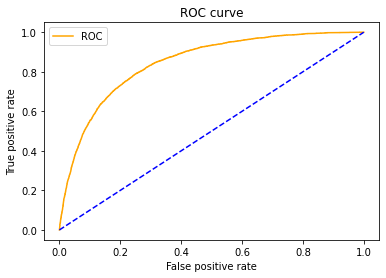




Area under the curve:  0.845907617974849


In [75]:
# XGBoost without tuning hyper parameters
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score,f1_score
from sklearn.metrics import roc_curve, auc, precision_recall_curve, classification_report, average_precision_score

data_dmatrix = xgb.DMatrix(data=prep_df,label=y)
#data_dmatrix = xgb.DMatrix(data=train,label=yy)

model = XGBClassifier()
model.fit(X_train, y_train)
xbg_pred = model.predict(X_test)
print(model.score(X_train,y_train))
print(model.score(X_test,y_test))

y_pred = model.predict_proba(X_test)
y_scores=y_pred[:,1]
fpr, tpr, threshhold = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)
average_precision = average_precision_score(y_test, y_scores)
precision, recall, _ = precision_recall_curve(y_test, y_scores)
print(roc_auc)
plot_roc_curve(fpr, tpr) 
print('\n\n')
print('Area under the curve: ', roc_auc_score(y_test, y_scores))

In [76]:
X_train, X_test, y_train, y_test = train_test_split(prep_df,y, test_size=0.20, random_state= 20, shuffle=True )

In [77]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor

xgbr = XGBRegressor()

max_depth = [3,5,10]
n_estimators = [500,600,800]
learning_rate = [0.15,0.3]
params = {
    #Hypeparameter tuning 
    'max_depth':max_depth,
    'n_estimators':n_estimators,
    'learning_rate':learning_rate}
xgbr_random = RandomizedSearchCV(estimator = xgbr, param_distributions = params, n_iter = 4, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
xgbr_random.fit(X_train, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  12 | elapsed:  3.6min remaining:  7.3min
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed: 17.4min finished


RandomizedSearchCV(cv=3,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          random_state=None, reg_alpha=None,
                                       

In [78]:
xgbr_random.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.15, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=600, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [33]:
xgbr_random.best_score_

0.2885475479351351

In [79]:
xgbr_random.best_params_

{'n_estimators': 600, 'max_depth': 3, 'learning_rate': 0.15}

In [80]:
# XGboost with tuning hyper parameters
xgb_cls = xgb.XGBClassifier(max_depth = 3, subsample = 1, colsample_bytree = 1, colsample_bylevel = 1,
    scale_pos_weight = 1,min_child_weight = 1,reg_alpha = 0, n_jobs = 8, objective = 'binary:logistic', gamma = 0,
    nthread=20, seed = 27, n_estimators=600)

xgb_cls.fit(X_train,y_train)

y_pred = xgb_cls.predict_proba(X_test)
y_scores=y_pred[:,1]
fpr, tpr, threshhold = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)
average_precision = average_precision_score(y_test, y_scores)
precision, recall, _ = precision_recall_curve(y_test, y_scores)
print(roc_auc)

[09:17:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8486545933718725


In [81]:
#Preprocessing Test dataset

test_df1 = test_df.iloc[:, :45]
prep_tf1,tff = preProcessing1(test_df1, y)
prep_tf1.index = test_df.index

test_df2 = test_df.iloc[:, 45:90]
prep_tf2,tff = preProcessing2(test_df2, y)
prep_tf2.index = test_df.index

test_df3 = test_df.iloc[:, 90:135]
prep_tf3,tff = preProcessing3(test_df3, y)
prep_tf3.index = test_df.index

test_df4 = test_df.iloc[:,135:]
prep_tf4,tff = preProcessing4(test_df4, y)
prep_tf4.index = test_df.index

prep_tf = pd.concat([prep_tf1, prep_tf2, prep_tf3, prep_tf4], axis=1)


 49%|███████████████████████████████████████▌                                         | 22/45 [00:00<00:00, 212.65it/s]

0.5740782977537242
0.9959604132855211
0.9939566103365394
0.6873459768647066
0.7132558554071958
0.6937095501494343
0.994802287622916
0.5460904640423478
0.6154658812911247
0.996305317029007
0.605693052499227
0.5235209259150457
0.9954147514843418
0.9690914166433616
0.5998422748974985
0.5068160737823504
0.7211500752885533
0.4913869970796102
0.9770157090981717


100%|█████████████████████████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 216.32it/s]

0.4948704572996141


In [82]:
prep_tf

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,age,bmi,elective_surgery,height,...,h1_calcium_max,h1_calcium_min,h1_creatinine_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
1,Caucasian,F,Floor,Accident & Emergency,admit,Med-Surg ICU,72.0,29.116463,0.0,152.4,...,4.098136e+00,4.126368e+00,-0.002159,0,0,0,0,0,0,0
2,Caucasian,F,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,86.0,29.116463,0.0,175.3,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
3,Caucasian,F,Floor,Floor,admit,Med-Surg ICU,72.0,29.116463,0.0,162.6,...,2.312587e+00,2.336550e+00,-1.039978,0,0,0,0,0,0,0
4,Caucasian,M,Floor,Floor,admit,Med-Surg ICU,66.0,29.116463,0.0,177.8,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
5,Caucasian,M,Direct Admit,Accident & Emergency,admit,Med-Surg ICU,89.0,29.116463,0.0,170.2,...,1.037195e+00,1.058109e+00,0.012255,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10230,Caucasian,F,Floor,Floor,admit,Med-Surg ICU,36.0,37.500000,0.0,170.1,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
10231,Caucasian,F,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,61.0,32.100000,0.0,160.0,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
10232,Caucasian,F,Step-Down Unit (SDU),Floor,admit,Med-Surg ICU,74.0,22.700000,0.0,165.1,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
10233,Caucasian,F,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,90.0,19.900000,0.0,160.0,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0


In [83]:
categorical_features = [feature for feature in prep_tf.columns if prep_tf[feature].dtype == 'O']
numerical_features = [feature for feature in prep_tf.columns if prep_tf[feature].dtype != 'O']
binary_features = [feature for feature in numerical_features if prep_tf[feature].nunique() == 2]
cont_features = [feature for feature in numerical_features if feature not in binary_features]

print("categorical features:" , len(categorical_features))
print("Numerical features:" , len(numerical_features))
print("Binary features:" , len(binary_features))
print("Continuous features:" , len(cont_features))

categorical features: 6
Numerical features: 125
Binary features: 12
Continuous features: 113


In [38]:
# avg_feature_df = prep_tf.copy()
# max_min_df = avg_feature_df[cont_features].copy()

# max_min_features = [feature for feature in cont_features if '_max' in feature or '_min' in feature and feature not in "albumin_apache"]
# print("total number of features: ",len(max_min_features))

# #separate out the max and min features
# max_features = [feature for feature in max_min_features if "_max" in feature]
# min_features = [feature for feature in max_min_features if "_min" in feature]
# print("Number of max features: ",len(max_features))
# print("Number of min features: ",len(min_features))

# #There is some mismatch between max and min features count. Because of 2 reasons:
# #1. One feature i.e h1_creatinine_min has more than 50% (81%)of missing values so it's been removed from dataset

# #so, to make feature count same let's remove the h1_creatinine_max from max_features.
# print("After adjustment")
# max_features.remove('h1_creatinine_max')
# max_min_features.remove('h1_creatinine_max')
# print("total number of features: ",len(max_min_features))
# print("Number of max features: ",len(max_features))
# print("Number of min features: ",len(min_features))

In [39]:
# # take the average and add them to the data.
# for i in range(0,len(max_features)):
#     col = "_".join(min_features[i].split("_")[:-1]) + "_avg"
#     avg = (max_min_df[min_features[i]] +  max_min_df[max_features[i]]) / 2
#     max_min_df[col] = avg

# # we got our average features, now remove the max and min features from data
# max_min_df.drop(max_features, axis=1, inplace=True)
# max_min_df.drop(min_features, axis=1, inplace=True)

# # we have reduce a 31 features, which is better then PCA too.
# max_min_df.shape

# avg_features = [feature for feature in max_min_df.columns if 'avg' in feature]
# print("Number of Average Features:" , len(avg_features))


# #let's see the percentage of missing values, if % will be less ten 30 then we will impute it.
# miss_nan = max_min_df[avg_features].isnull().sum() / len(max_min_df) * 100
# miss_nan.sort_values(ascending=False).to_frame().head(10)

# #drop the feature which are having missing greater then 30%
# great_30 = miss_nan[miss_nan[:] > 30].index
# max_min_df.drop(great_30, axis=1, inplace=True)

# less_30 = miss_nan[miss_nan[:] < 30].index
# # as we have taken the avg, so just fill it with mean now.
# for col in less_30:
#     max_min_df[col] = max_min_df[col].fillna(max_min_df[col].mean())

In [40]:
# #Working on Numerarical features other than the min max features
# other_nan_col = [feature for feature in max_min_df.columns if "avg" not in feature]
# print("total other features then AVG: ", len(other_nan_col))

# for col in other_nan_col:
#     max_min_df[col] = max_min_df[col].fillna(max_min_df[col].mean())

# #check if any null values remaining
# max_min_df.isnull().sum().sum()

# avg_feature_df.drop(cont_features,axis=1, inplace=True)

# avg_feature_df = pd.concat([avg_feature_df, max_min_df], axis=1)

# avg_feature_df.shape

# #We have reduced 45 features from the dataset. (131-45=86)

In [84]:
#Working on Categorical features

prep_tf['gender'] = prep_tf['gender'].map({'M':0,'F':1})

# let's encode the feature using Integer label encoding
# we will use value_counts to know, how it is encoded, you can also use unique()
cat_cols = ['ethnicity', 'hospital_admit_source','icu_admit_source','icu_stay_type','icu_type']
for col in cat_cols:
    map_dict = {k: i for i, k in enumerate(prep_tf[col].value_counts().index, 0)}
    prep_tf[col] = prep_tf[col].map(map_dict)

prep_tf[categorical_features].head(2)

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type
1,0,1,1,0,0,0
2,0,1,0,0,0,0


In [85]:
prep_tf

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,age,bmi,elective_surgery,height,...,h1_calcium_max,h1_calcium_min,h1_creatinine_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
1,0,1,1,0,0,0,72.0,29.116463,0.0,152.4,...,4.098136e+00,4.126368e+00,-0.002159,0,0,0,0,0,0,0
2,0,1,0,0,0,0,86.0,29.116463,0.0,175.3,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
3,0,1,1,2,0,0,72.0,29.116463,0.0,162.6,...,2.312587e+00,2.336550e+00,-1.039978,0,0,0,0,0,0,0
4,0,0,1,2,0,0,66.0,29.116463,0.0,177.8,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
5,0,0,3,0,0,0,89.0,29.116463,0.0,170.2,...,1.037195e+00,1.058109e+00,0.012255,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10230,0,1,1,2,0,0,36.0,37.500000,0.0,170.1,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
10231,0,1,0,0,0,0,61.0,32.100000,0.0,160.0,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
10232,0,1,6,2,0,0,74.0,22.700000,0.0,165.1,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0
10233,0,1,0,0,0,0,90.0,19.900000,0.0,160.0,...,-4.531102e-15,-9.083870e-15,0.000000,0,0,0,0,0,0,0


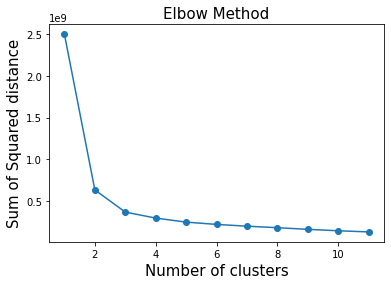

In [42]:
# #Clustering apart from being an unsupervised machine learning can also be used to 
# #create clusters as features to improve classification models.

# # plot elbow curve
# from sklearn.cluster import KMeans
# from sklearn.preprocessing import StandardScaler
# import scipy.cluster.hierarchy as hcluster
# from sklearn.cluster import AgglomerativeClustering
# import matplotlib.pyplot as plt

# #drop country column
# data=prep_tf.drop(['ethnicity'],axis=1)

# #scaling data
# scaling=StandardScaler()
# scaled=scaling.fit_transform(data)

# scaled_df=pd.DataFrame(scaled,columns=data.columns)

# # princt scaled dataset
# scaled_df.head()

# a=[]
# K=range(1,12)
# for i in K:
#     kmean=KMeans(n_clusters=i)
#     kmean.fit(data)
#     a.append(kmean.inertia_)
    
# plt.plot(K,a,marker='o')
# plt.title('Elbow Method',fontsize=15)
# plt.xlabel('Number of clusters',fontsize=15)
# plt.ylabel('Sum of Squared distance',fontsize=15)
# plt.show()

In [48]:
# scaled_df

,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,age,bmi,elective_surgery,height,pre_icu_los_days,...,h1_calcium_max,h1_calcium_min,h1_creatinine_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
0,1.084249,0.089404,-0.730016,-0.114447,-0.736546,0.512379,0.000000,-0.500183,-1.585373,-0.338359,...,4.098136e+00,4.126368e+00,-2.159260e-03,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
1,1.084249,-0.600092,-0.730016,-0.114447,-0.736546,1.296658,0.000000,-0.500183,0.565857,-0.344694,...,3.181266e-17,-7.342642e-16,6.109807e-17,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
2,1.084249,0.089404,1.533576,-0.114447,-0.736546,0.512379,0.000000,-0.500183,-0.627184,-0.343254,...,2.312587e+00,2.336550e+00,-1.039978e+00,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
3,-0.922298,0.089404,1.533576,-0.114447,-0.736546,0.176260,0.000000,-0.500183,0.800707,0.021846,...,3.181266e-17,-7.342642e-16,6.109807e-17,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
4,-0.922298,1.468396,-0.730016,-0.114447,-0.736546,1.464718,0.000000,-0.500183,0.086762,-0.339223,...,1.037195e+00,1.058109e+00,1.225489e-02,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10229,1.084249,0.089404,1.533576,-0.114447,-0.736546,-1.504338,1.058805,-0.500183,0.077368,0.358729,...,3.181266e-17,-7.342642e-16,6.109807e-17,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
10230,1.084249,-0.600092,-0.730016,-0.114447,-0.736546,-0.103840,0.376808,-0.500183,-0.871428,-0.330873,...,3.181266e-17,-7.342642e-16,6.109807e-17,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
10231,1.084249,3.536883,1.533576,-0.114447,-0.736546,0.624419,-0.810372,-0.500183,-0.392333,-0.030558,...,3.181266e-17,-7.342642e-16,6.109807e-17,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181
10232,1.084249,-0.600092,-0.730016,-0.114447,-0.736546,1.520738,-1.164000,-0.500183,-0.871428,-0.308414,...,3.181266e-17,-7.342642e-16,6.109807e-17,-0.031274,-0.110295,-0.100831,-0.151964,-0.081178,-0.064194,-0.134181


In [43]:
# #chosing no. of clusters as 4 and refitting kmeans model
# kmeans = KMeans(n_clusters = 4,random_state = 111)
# kmeans.fit(scaled_df)

KMeans(n_clusters=4, random_state=111)

In [44]:
# #count number of records in every cluster
# pd.Series(kmeans.labels_).value_counts()

3    3871
1    3461
0    1692
2    1210
dtype: int64

In [49]:
# #predicting values
# cluster_labels = kmeans.fit_predict(scaled_df)

# preds = kmeans.labels_
# kmeans_df = pd.DataFrame(prep_tf)
# kmeans_df['KMeans_Cluster'] = preds
# kmeans_df.head(10)

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,age,bmi,elective_surgery,height,...,h1_calcium_min,h1_creatinine_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,KMeans_Cluster
1,0,1,1,0,0,0,72.0,29.116463,0.0,152.400000,...,4.126368e+00,-0.002159,0,0,0,0,0,0,0,3
2,0,1,0,0,0,0,86.0,29.116463,0.0,175.300000,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,1
3,0,1,1,2,0,0,72.0,29.116463,0.0,162.600000,...,2.336550e+00,-1.039978,0,0,0,0,0,0,0,1
4,0,0,1,2,0,0,66.0,29.116463,0.0,177.800000,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,3
5,0,0,3,0,0,0,89.0,29.116463,0.0,170.200000,...,1.058109e+00,0.012255,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,75.0,29.116463,0.0,172.700000,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,1
7,0,1,1,2,0,0,38.0,29.116463,0.0,169.276414,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,3
8,0,1,1,2,0,0,87.0,29.116463,0.0,152.400000,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,3
9,0,1,0,2,0,0,85.0,29.116463,0.0,172.700000,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,2
10,0,0,1,2,0,0,64.0,29.116463,0.0,182.900000,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,2


In [50]:
# kmeans_df

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,age,bmi,elective_surgery,height,...,h1_calcium_min,h1_creatinine_max,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,KMeans_Cluster
1,0,1,1,0,0,0,72.0,29.116463,0.0,152.4,...,4.126368e+00,-0.002159,0,0,0,0,0,0,0,3
2,0,1,0,0,0,0,86.0,29.116463,0.0,175.3,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,1
3,0,1,1,2,0,0,72.0,29.116463,0.0,162.6,...,2.336550e+00,-1.039978,0,0,0,0,0,0,0,1
4,0,0,1,2,0,0,66.0,29.116463,0.0,177.8,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,3
5,0,0,3,0,0,0,89.0,29.116463,0.0,170.2,...,1.058109e+00,0.012255,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10230,0,1,1,2,0,0,36.0,37.500000,0.0,170.1,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,1
10231,0,1,0,0,0,0,61.0,32.100000,0.0,160.0,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,1
10232,0,1,6,2,0,0,74.0,22.700000,0.0,165.1,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,3
10233,0,1,0,0,0,0,90.0,19.900000,0.0,160.0,...,-9.083870e-15,0.000000,0,0,0,0,0,0,0,3


In [51]:
# # Train and test split
# prep_tf = kmeans_df.copy().select_dtypes(include=np.number)

In [86]:
model = XGBClassifier()
model.fit(X_train, y_train)
test_pred = model.predict(prep_tf)


[09:19:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [87]:
# Submission dataframe
submit = test_df[['encounter_id']]
submit['diabetes_mellitus'] = test_pred
submit.to_csv('test_pred_exp2.csv',index=False)
submit.head()

,encounter_id,diabetes_mellitus
1,144740,0
2,141990,0
3,142038,0
4,138628,0
5,141682,0


In [88]:
xgb_cls.fit(X_train,y_train)

xgb_cls_pred = xgb_cls.predict_proba(prep_tf)[:,1]

[09:19:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [89]:
# Submission dataframe
submit = test_df[['encounter_id']]
submit['diabetes_mellitus'] = xgb_cls_pred
submit.to_csv('xgb_cls_exp2.csv',index=False)
submit.head()

,encounter_id,diabetes_mellitus
1,144740,0.063040
2,141990,0.216462
3,142038,0.194087
4,138628,0.111490
5,141682,0.314002


In [90]:
X_train, X_test, y_train, y_test = train_test_split(prep_df,y, test_size=0.20, random_state= 20, shuffle=True )

In [91]:
classifier = LGBMClassifier(n_estimators= 1000, max_depth= 7)
classifier.fit(X_train, y_train)
print('\n\n')
classifier.score(X_test, y_test)
print('\n\n')
classifier.fit(prep_df, y)
#classifier.fit(train, yy)
result = metrics.roc_auc_score(y.values, classifier.predict(prep_df))
result

0.8557558019429244

In [92]:

model = LGBMClassifier(n_estimators= 1000, max_depth= 7)
model.fit(X_train, y_train)
test_pred = model.predict(prep_tf)

# Submission dataframe
submit = test_df[['encounter_id']]
submit['diabetes_mellitus'] = test_pred
submit.to_csv('test_pred_21.csv',index=False)
submit.head()

,encounter_id,diabetes_mellitus
1,144740,0
2,141990,0
3,142038,0
4,138628,0
5,141682,0
